In [26]:
import pandas as pd
import geopandas as gpd
import folium
import json
import matplotlib.pyplot as plt
import numpy as np


# EDA


In [4]:
geojson_path = r'C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\data\extra\acs2022_5yr_B01001_14000US41051001602.geojson'
age_census_tract = gpd.read_file(geojson_path)

In [5]:
with open(geojson_path) as f:
    data = json.load(f)

# Print the contents of the GeoJSON file
print(json.dumps(data, indent=4))

{
    "type": "FeatureCollection",
    "name": "acs2022_5yr_B01001_14000US41051001602",
    "crs": {
        "type": "name",
        "properties": {
            "name": "urn:ogc:def:crs:OGC:1.3:CRS84"
        }
    },
    "features": [
        {
            "type": "Feature",
            "properties": {
                "geoid": "01000US",
                "name": "United States",
                "B01001001": 331097600.0,
                "B01001001, Error": null,
                "B01001002": 164200300.0,
                "B01001002, Error": 8084.0,
                "B01001003": 9725644.0,
                "B01001003, Error": 3889.0,
                "B01001004": 10210019.0,
                "B01001004, Error": 22849.0,
                "B01001005": 10974635.0,
                "B01001005, Error": 22485.0,
                "B01001006": 6577849.0,
                "B01001006, Error": 4115.0,
                "B01001007": 4618967.0,
                "B01001007, Error": 4552.0,
                "B010010

In [6]:
df = pd.read_csv(r"C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\data\acs2022_5yr_B01001_14000US41051001602\data.csv")
df.head()


,geoid,name,Total pop.,"B01001001, Error",Male:,"B01001002, Error",Under 5 years,"B01001003, Error",5 to 9 years,"B01001004, Error",...,B01001045,"B01001045, Error",B01001046,"B01001046, Error",B01001047,"B01001047, Error",B01001048,"B01001048, Error",B01001049,"B01001049, Error"
0,01000US,United States,331097600,NaN,164200300,8084,9725644,3889,10210019,22849,...,5412557,14610,7679431,19424,5393379,14196,3622161,12936,4185150,15412
1,04000US41,Oregon,4229374,NaN,2113341,1051,110843,588,121532,2217,...,80496,1663,110011,1755,73871,1707,44100,1342,53720,1705
2,05000US41051,"Multnomah County, OR",808098,NaN,403380,130,20110,60,20458,860,...,11878,621,16654,618,11044,621,6244,520,7834,620
3,14000US41051000101,"Census Tract 1.01, Multnomah, OR",3187,613.0,1551,368,77,64,113,108,...,12,18,25,29,176,98,52,45,14,20
4,14000US41051000102,"Census Tract 1.02, Multnomah, OR",3746,290.0,1877,213,98,92,23,27,...,49,44,142,61,15,24,18,29,14,18


In [7]:
error_columns = [col for col in df.columns if 'Error' in col]
clean_df = df.drop(columns=error_columns)

In [8]:
clean_df.head()

,geoid,name,Total pop.,Male:,Under 5 years,5 to 9 years,10 to 14 years,15 to 17 years,18 and 19 years,20 years,...,B01001040,B01001041,B01001042,B01001043,B01001044,B01001045,B01001046,B01001047,B01001048,B01001049
0,01000US,United States,331097600,164200300,9725644,10210019,10974635,6577849,4618967,2348124,...,10407290,10907144,4453471,6344590,3962963,5412557,7679431,5393379,3622161,4185150
1,04000US41,Oregon,4229374,2113341,110843,121532,130373,77334,52942,26967,...,124871,128004,58742,85350,55761,80496,110011,73871,44100,53720
2,05000US41051,"Multnomah County, OR",808098,403380,20110,20458,21554,12353,8399,3763,...,24724,21739,9155,14195,9431,11878,16654,11044,6244,7834
3,14000US41051000101,"Census Tract 1.01, Multnomah, OR",3187,1551,77,113,132,97,0,0,...,257,62,17,42,54,12,25,176,52,14
4,14000US41051000102,"Census Tract 1.02, Multnomah, OR",3746,1877,98,23,116,107,58,13,...,92,128,124,31,68,49,142,15,18,14


In [9]:
clean_df.info

<bound method DataFrame.info of                   geoid                                name  Total pop.  \
0               01000US                       United States   331097600   
1             04000US41                              Oregon     4229374   
2          05000US41051                Multnomah County, OR      808098   
3    14000US41051000101    Census Tract 1.01, Multnomah, OR        3187   
4    14000US41051000102    Census Tract 1.02, Multnomah, OR        3746   
..                  ...                                 ...         ...   
195  14000US41051010413  Census Tract 104.13, Multnomah, OR        5128   
196  14000US41051010500     Census Tract 105, Multnomah, OR        3863   
197  14000US41051010601  Census Tract 106.01, Multnomah, OR        1502   
198  14000US41051010602  Census Tract 106.02, Multnomah, OR        1963   
199  14000US41051980000    Census Tract 9800, Multnomah, OR           0   

         Male:  Under 5 years  5 to 9 years  10 to 14 years  15 to 

In [10]:
ccd_data = pd.read_csv(r"C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\data\extra\DECENNIALDP2020.DP1-2024-03-26T154125.csv")
ccd_data

,Label (Grouping),SEX AND AGE,Total population,Total population (Under 5 years),Total population (5 to 9 years),Total population (10 to 14 years),Total population (15 to 19 years),Total population (20 to 24 years),Total population (25 to 29 years),Total population (30 to 34 years),...,"HOUSING OCCUPANCY(Total housing units(Vacant housing units(Sold, not occupied","HOUSING OCCUPANCY(Total housing units(Vacant housing units(For seasonal, recreational, or occasional use",HOUSING OCCUPANCY(Total housing units(Vacant housing units(All other vacants,VACANCY RATES,VACANCY RATES(Homeowner vacancy rate (percent) [4],VACANCY RATES(Rental vacancy rate (percent) [5],HOUSING TENURE,HOUSING TENURE(Occupied housing units,HOUSING TENURE(Occupied housing units(Owner-occupied housing units,HOUSING TENURE(Occupied housing units(Renter-occupied housing units
0,Oregon,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Oregon Count,NaN,"4,237,256","215,252","242,852","257,649","255,559","265,951","285,772","300,930",...,"5,533","53,443","28,511",NaN,1.2,5.5,NaN,"1,671,983","1,031,887","640,096"
2,Oregon Percent,NaN,100.0%,5.1%,5.7%,6.1%,6.0%,6.3%,6.7%,7.1%,...,0.3%,2.9%,1.6%,NaN,(X),(X),NaN,100.0%,61.7%,38.3%
3,Corbett CCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Corbett CCD Count,NaN,"3,947",156,230,259,266,170,145,179,...,4,52,43,NaN,1.0,6.7,NaN,"1,419","1,182",237
5,Corbett CCD Percent,NaN,100.0%,4.0%,5.8%,6.6%,6.7%,4.3%,3.7%,4.5%,...,0.3%,3.4%,2.8%,NaN,(X),(X),NaN,100.0%,83.3%,16.7%
6,Gresham CCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Gresham CCD Count,NaN,"151,977","9,204","9,937","10,407","9,932","10,342","11,002","11,260",...,56,156,451,NaN,0.8,4.4,NaN,"54,811","30,419","24,392"
8,Gresham CCD Percent,NaN,100.0%,6.1%,6.5%,6.8%,6.5%,6.8%,7.2%,7.4%,...,0.1%,0.3%,0.8%,NaN,(X),(X),NaN,100.0%,55.5%,44.5%
9,"Portland East CCD, Multnomah County, Oregon",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
ccd_data.drop(ccd_data.columns[82:176], axis=1, inplace=True)

In [12]:
ccd_data.drop(columns=['SEX AND AGE'], axis=1, inplace=True)

In [13]:
rows_to_drop = [0,3,6,9,12,15]
ccd_data.drop(rows_to_drop, inplace=True)

In [14]:
ccd_data

,Label (Grouping),Total population,Total population (Under 5 years),Total population (5 to 9 years),Total population (10 to 14 years),Total population (15 to 19 years),Total population (20 to 24 years),Total population (25 to 29 years),Total population (30 to 34 years),Total population (35 to 39 years),...,Female population (16 years and over),Female population (18 years and over),Female population (21 years and over),Female population (62 years and over),Female population (65 years and over),MEDIAN AGE BY SEX,MEDIAN AGE BY SEX (Both sexes),MEDIAN AGE BY SEX (Male),MEDIAN AGE BY SEX (Female),RACE
1,Oregon Count,"4,237,256","215,252","242,852","257,649","255,559","265,951","285,772","300,930","298,242",...,"1,766,700","1,717,750","1,637,714","515,792","429,521",NaN,39.9,39.0,40.9,NaN
2,Oregon Percent,100.0%,5.1%,5.7%,6.1%,6.0%,6.3%,6.7%,7.1%,7.0%,...,82.6%,80.3%,76.5%,24.1%,20.1%,NaN,(X),(X),(X),NaN
4,Corbett CCD Count,"3,947",156,230,259,266,170,145,179,248,...,"1,632","1,580","1,516",551,452,NaN,45.8,45.4,46.2,NaN
5,Corbett CCD Percent,100.0%,4.0%,5.8%,6.6%,6.7%,4.3%,3.7%,4.5%,6.3%,...,82.3%,79.7%,76.5%,27.8%,22.8%,NaN,(X),(X),(X),NaN
7,Gresham CCD Count,"151,977","9,204","9,937","10,407","9,932","10,342","11,002","11,260","10,618",...,"61,970","60,011","57,113","15,748","12,952",NaN,36.8,35.6,38.0,NaN
8,Gresham CCD Percent,100.0%,6.1%,6.5%,6.8%,6.5%,6.8%,7.2%,7.4%,7.0%,...,80.2%,77.7%,73.9%,20.4%,16.8%,NaN,(X),(X),(X),NaN
10,Portland East CCD Count,"509,591","24,640","26,063","26,281","25,358","30,399","45,382","51,549","49,260",...,"218,922","214,102","205,803","45,560","37,590",NaN,37.5,37.2,37.7,NaN
11,Portland East CCD Percent,100.0%,4.8%,5.1%,5.2%,5.0%,6.0%,8.9%,10.1%,9.7%,...,84.6%,82.7%,79.5%,17.6%,14.5%,NaN,(X),(X),(X),NaN
13,Portland West CCD Count,"147,142","5,053","5,736","5,944","6,594","11,182","15,658","14,371","11,792",...,"64,587","63,361","60,636","15,653","13,045",NaN,38.8,38.8,38.7,NaN
14,Portland West CCD Percent,100.0%,3.4%,3.9%,4.0%,4.5%,7.6%,10.6%,9.8%,8.0%,...,88.1%,86.4%,82.7%,21.4%,17.8%,NaN,(X),(X),(X),NaN


In [15]:
num_columns_to_drop = 5
ccd_data = ccd_data.iloc[:, :-num_columns_to_drop]

# Display the DataFrame after dropping the columns
ccd_data

,Label (Grouping),Total population,Total population (Under 5 years),Total population (5 to 9 years),Total population (10 to 14 years),Total population (15 to 19 years),Total population (20 to 24 years),Total population (25 to 29 years),Total population (30 to 34 years),Total population (35 to 39 years),...,Female population (70 to 74 years),Female population (75 to 79 years),Female population (80 to 84 years),Female population (85 years and over),Female population (Selected Age Categories),Female population (16 years and over),Female population (18 years and over),Female population (21 years and over),Female population (62 years and over),Female population (65 years and over)
1,Oregon Count,"4,237,256","215,252","242,852","257,649","255,559","265,951","285,772","300,930","298,242",...,"114,863","76,315","47,097","51,658",NaN,"1,766,700","1,717,750","1,637,714","515,792","429,521"
2,Oregon Percent,100.0%,5.1%,5.7%,6.1%,6.0%,6.3%,6.7%,7.1%,7.0%,...,5.4%,3.6%,2.2%,2.4%,NaN,82.6%,80.3%,76.5%,24.1%,20.1%
4,Corbett CCD Count,"3,947",156,230,259,266,170,145,179,248,...,123,85,37,26,NaN,"1,632","1,580","1,516",551,452
5,Corbett CCD Percent,100.0%,4.0%,5.8%,6.6%,6.7%,4.3%,3.7%,4.5%,6.3%,...,6.2%,4.3%,1.9%,1.3%,NaN,82.3%,79.7%,76.5%,27.8%,22.8%
7,Gresham CCD Count,"151,977","9,204","9,937","10,407","9,932","10,342","11,002","11,260","10,618",...,"3,290","2,180","1,446","1,715",NaN,"61,970","60,011","57,113","15,748","12,952"
8,Gresham CCD Percent,100.0%,6.1%,6.5%,6.8%,6.5%,6.8%,7.2%,7.4%,7.0%,...,4.3%,2.8%,1.9%,2.2%,NaN,80.2%,77.7%,73.9%,20.4%,16.8%
10,Portland East CCD Count,"509,591","24,640","26,063","26,281","25,358","30,399","45,382","51,549","49,260",...,"10,032","6,260","3,764","4,589",NaN,"218,922","214,102","205,803","45,560","37,590"
11,Portland East CCD Percent,100.0%,4.8%,5.1%,5.2%,5.0%,6.0%,8.9%,10.1%,9.7%,...,3.9%,2.4%,1.5%,1.8%,NaN,84.6%,82.7%,79.5%,17.6%,14.5%
13,Portland West CCD Count,"147,142","5,053","5,736","5,944","6,594","11,182","15,658","14,371","11,792",...,"3,723","2,216","1,349","1,400",NaN,"64,587","63,361","60,636","15,653","13,045"
14,Portland West CCD Percent,100.0%,3.4%,3.9%,4.0%,4.5%,7.6%,10.6%,9.8%,8.0%,...,5.1%,3.0%,1.8%,1.9%,NaN,88.1%,86.4%,82.7%,21.4%,17.8%


In [16]:
ccd_data.to_csv("ccd_data_to_clean.csv", index=False)

In [17]:
# Read the shapefile
shapefile_path = r"C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\data\extra\cb_2018_41_cousub_500k.shp"
gdf = gpd.read_file(shapefile_path)


In [18]:
gdf

,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,41,019,92686,01938106,0600000US4101992686,4101992686,Roseburg,22,271355900,3611169,"POLYGON ((-123.44948 43.26487, -123.44599 43.2..."
1,41,043,90068,01937952,0600000US4104390068,4104390068,Albany,22,353404275,4572199,"POLYGON ((-123.26079 44.55749, -123.26025 44.5..."
2,41,011,92567,01938099,0600000US4101192567,4101192567,Powers,22,746170408,1088841,"POLYGON ((-124.20713 42.91003, -124.20446 42.9..."
3,41,031,90782,01937994,0600000US4103190782,4103190782,Culver,22,308119180,6508423,"POLYGON ((-121.33552 44.46008, -121.33433 44.4..."
4,41,039,91147,01938079,0600000US4103991147,4103991147,Florence,22,658783366,174570391,"POLYGON ((-124.13694 44.02301, -124.13425 44.0..."
...,...,...,...,...,...,...,...,...,...,...,...
207,41,031,90136,01937956,0600000US4103190136,4103190136,Ashwood,22,1961453450,1670989,"POLYGON ((-121.24729 44.46407, -121.24525 44.4..."
208,41,041,93230,01938138,0600000US4104193230,4104193230,Toledo,22,212269408,6012926,"POLYGON ((-124.02196 44.58687, -124.02121 44.5..."
209,41,045,90833,01937997,0600000US4104590833,4104590833,Dead Ox Flat,22,104209412,3700131,"POLYGON ((-117.04706 44.22974, -117.04551 44.2..."
210,41,067,92210,01938078,0600000US4106792210,4106792210,North Plains,22,218984243,42264,"POLYGON ((-123.12744 45.77136, -123.12596 45.7..."


In [19]:
gdf.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 212 entries, 0 to 211
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   212 non-null    object  
 1   COUNTYFP  212 non-null    object  
 2   COUSUBFP  212 non-null    object  
 3   COUSUBNS  212 non-null    object  
 4   AFFGEOID  212 non-null    object  
 5   GEOID     212 non-null    object  
 6   NAME      212 non-null    object  
 7   LSAD      212 non-null    object  
 8   ALAND     212 non-null    int64   
 9   AWATER    212 non-null    int64   
 10  geometry  212 non-null    geometry
dtypes: geometry(1), int64(2), object(8)
memory usage: 18.3+ KB


In [20]:
gdf.to_csv('gdf_csv.csv', index=False)

In [21]:
unique_gdf_values = gdf['NAME'].unique()
print(unique_gdf_values)

['Roseburg' 'Albany' 'Powers' 'Culver' 'Florence' 'Adrian' 'Fossil'
 'John Day' 'Eugene-Springfield' 'Bend' 'Waldport' 'Eagle Valley'
 'Sutherlin' 'East Linn' 'Joseph' 'Halfway' 'Pendleton'
 'Northwest Josephine' 'McMinnville' 'Southwest Jackson' 'Harbor'
 'Depoe Bay' 'Jordan Valley' 'East Marion' 'Medford' 'McKenzie River'
 'Eastside' 'Keno' 'Union' 'Brogan' 'Juntura' 'Vale' 'Mill City'
 'Sweet Home' 'Lakeview' 'Silver Lake-Fort Rock' 'Crooked River'
 'Prineville' 'Wilderville' 'Beaverton-Hillsboro' 'Shady Cove' 'Jewell'
 'Agness' 'Brookings' 'Gold Beach' 'Port Orford' 'Kellogg-Yoncalla'
 'Myrtle Creek-Riddle' 'South Umpqua' 'Forest Grove-Cornelius' 'Siletz'
 'Estacada' 'Upper Siuslaw River' 'Myrtle Point' 'Dufur' 'Cave Junction'
 'Condon' 'Grandview' 'Warm Springs' 'Eddyville' 'Klamath Falls'
 'Arlington' 'Baker City' 'Marcola' 'Mount Hood' 'Northwest Clackamas'
 'Melrose' 'Athena' 'Nehalem' 'Tillamook' 'Butte Falls-Prospect'
 'Badger Mountain' 'Middle Siuslaw River-Triangle Lake' 'L

In [22]:
target_areas = ('Portland West', 'Portland East','Gresham','Skyline','Corbett')
filtered_gdf = gdf[gdf['NAME'].isin(target_areas)]

# Display the filtered GeoDataFrame
print(filtered_gdf)

    STATEFP COUNTYFP COUSUBFP  COUSUBNS             AFFGEOID       GEOID  \
127      41      051    91249  02585636  0600000US4105191249  4105191249   
152      41      051    92518  02585638  0600000US4105192518  4105192518   
175      41      051    90663  01937987  0600000US4105190663  4105190663   
185      41      051    92975  01938123  0600000US4105192975  4105192975   
202      41      051    92520  02585640  0600000US4105192520  4105192520   

              NAME LSAD      ALAND    AWATER  \
127        Gresham   22  141350702  16015506   
152  Portland East   22  246354639  28120908   
175        Corbett   22  471839980  25556906   
185        Skyline   22  130491569  12811429   
202  Portland West   22  126521886   5717519   

                                              geometry  
127  POLYGON ((-122.58601 45.60474, -122.58233 45.6...  
152  POLYGON ((-122.79107 45.62645, -122.79057 45.6...  
175  POLYGON ((-122.39710 45.57260, -122.39180 45.5...  
185  POLYGON ((-122.92919 

In [28]:
merged_ccd_csv = pd.read_csv(r'C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\ccd_data_to_clean.csv')

In [29]:
merged_gdf = filtered_gdf.merge(merged_ccd_csv, on='NAME', how='inner')

In [30]:
merged_gdf

,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,...,Female population (70 to 74 years),Female population (75 to 79 years),Female population (80 to 84 years),Female population (85 years and over),Female population (Selected Age Categories),Female population (16 years and over),Female population (18 years and over),Female population (21 years and over),Female population (62 years and over),Female population (65 years and over)
0,41,051,91249,02585636,0600000US4105191249,4105191249,Gresham,22,141350702,16015506,...,"3,290","2,180","1,446","1,715",NaN,"61,970","60,011","57,113","15,748","12,952"
1,41,051,91249,02585636,0600000US4105191249,4105191249,Gresham,22,141350702,16015506,...,4.30%,2.80%,1.90%,2.20%,NaN,80.20%,77.70%,73.90%,20.40%,16.80%
2,41,051,92518,02585638,0600000US4105192518,4105192518,Portland East,22,246354639,28120908,...,"10,032","6,260","3,764","4,589",NaN,"218,922","214,102","205,803","45,560","37,590"
3,41,051,92518,02585638,0600000US4105192518,4105192518,Portland East,22,246354639,28120908,...,3.90%,2.40%,1.50%,1.80%,NaN,84.60%,82.70%,79.50%,17.60%,14.50%
4,41,051,90663,01937987,0600000US4105190663,4105190663,Corbett,22,471839980,25556906,...,123,85,37,26,NaN,"1,632","1,580","1,516",551,452
5,41,051,90663,01937987,0600000US4105190663,4105190663,Corbett,22,471839980,25556906,...,6.20%,4.30%,1.90%,1.30%,NaN,82.30%,79.70%,76.50%,27.80%,22.80%
6,41,051,92975,01938123,0600000US4105192975,4105192975,Skyline,22,130491569,12811429,...,93,85,25,23,NaN,"1,170","1,148","1,120",481,400
7,41,051,92975,01938123,0600000US4105192975,4105192975,Skyline,22,130491569,12811429,...,6.80%,6.30%,1.80%,1.70%,NaN,86.10%,84.50%,82.40%,35.40%,29.40%
8,41,051,92520,02585640,0600000US4105192520,4105192520,Portland West,22,126521886,5717519,...,"3,723","2,216","1,349","1,400",NaN,"64,587","63,361","60,636","15,653","13,045"
9,41,051,92520,02585640,0600000US4105192520,4105192520,Portland West,22,126521886,5717519,...,5.10%,3.00%,1.80%,1.90%,NaN,88.10%,86.40%,82.70%,21.40%,17.80%


In [31]:
# Convert to GeoJSON
geojson_data = merged_gdf.to_crs(epsg='4326').to_json()

In [32]:
file_path = 'multnomah_ccds.geojson'

# Write the GeoJSON string to the file
with open(file_path, 'w') as file:
    file.write(geojson_data)

print("GeoJSON file saved successfully at:", file_path)

GeoJSON file saved successfully at: multnomah_ccds.geojson


# Data Operations


In [13]:
final_gdf = gpd.read_file(r'C:\Users\israe\Desktop\Files\Coding\Repos\LWV_Project_2024\Final Clean Data\multnomah_ccds.geojson')

In [14]:
final_gdf

,id,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,...,Female population (75 to 79 years),Female population (80 to 84 years),Female population (85 years and over),Female population (Selected Age Categories),Female population (16 years and over),Female population (18 years and over),Female population (21 years and over),Female population (62 years and over),Female population (65 years and over),geometry
0,0,41,051,91249,02585636,0600000US4105191249,4105191249,Gresham,22,141350702,...,"2,180","1,446","1,715",None,"61,970","60,011","57,113","15,748","12,952","POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
1,1,41,051,91249,02585636,0600000US4105191249,4105191249,Gresham,22,141350702,...,2.80%,1.90%,2.20%,None,80.20%,77.70%,73.90%,20.40%,16.80%,"POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
2,2,41,051,92518,02585638,0600000US4105192518,4105192518,Portland East,22,246354639,...,"6,260","3,764","4,589",None,"218,922","214,102","205,803","45,560","37,590","POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
3,3,41,051,92518,02585638,0600000US4105192518,4105192518,Portland East,22,246354639,...,2.40%,1.50%,1.80%,None,84.60%,82.70%,79.50%,17.60%,14.50%,"POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
4,4,41,051,90663,01937987,0600000US4105190663,4105190663,Corbett,22,471839980,...,85,37,26,None,"1,632","1,580","1,516",551,452,"POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
5,5,41,051,90663,01937987,0600000US4105190663,4105190663,Corbett,22,471839980,...,4.30%,1.90%,1.30%,None,82.30%,79.70%,76.50%,27.80%,22.80%,"POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
6,6,41,051,92975,01938123,0600000US4105192975,4105192975,Skyline,22,130491569,...,85,25,23,None,"1,170","1,148","1,120",481,400,"POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
7,7,41,051,92975,01938123,0600000US4105192975,4105192975,Skyline,22,130491569,...,6.30%,1.80%,1.70%,None,86.10%,84.50%,82.40%,35.40%,29.40%,"POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
8,8,41,051,92520,02585640,0600000US4105192520,4105192520,Portland West,22,126521886,...,"2,216","1,349","1,400",None,"64,587","63,361","60,636","15,653","13,045","POLYGON ((-122.86749 45.60623, -122.86423 45.6..."
9,9,41,051,92520,02585640,0600000US4105192520,4105192520,Portland West,22,126521886,...,3.00%,1.80%,1.90%,None,88.10%,86.40%,82.70%,21.40%,17.80%,"POLYGON ((-122.86749 45.60623, -122.86423 45.6..."


In [4]:
final_gdf.columns


Index(['id', 'STATEFP', 'COUNTYFP', 'COUSUBFP', 'COUSUBNS', 'AFFGEOID',
       'GEOID', 'NAME', 'LSAD', 'ALAND', 'AWATER', 'Label (Grouping)',
       'Total population', 'Total population (Under 5 years)',
       'Total population (5 to 9 years)', 'Total population (10 to 14 years)',
       'Total population (15 to 19 years)',
       'Total population (20 to 24 years)',
       'Total population (25 to 29 years)',
       'Total population (30 to 34 years)',
       'Total population (35 to 39 years)',
       'Total population (40 to 44 years)',
       'Total population (45 to 49 years)',
       'Total population (50 to 54 years)',
       'Total population (55 to 59 years)',
       'Total population (60 to 64 years)',
       'Total population (65 to 69 years)',
       'Total population (70 to 74 years)',
       'Total population (75 to 79 years)',
       'Total population (80 to 84 years)',
       'Total population (85 years and over)',
       'Total population (Selected Age Categories)',

In [15]:
print(final_gdf['Total population'])

0    151,977
1    100.00%
2    509,591
3    100.00%
4      3,947
5    100.00%
6      2,771
7    100.00%
8    147,142
9    100.00%
Name: Total population, dtype: object


In [29]:
total_pop_rows = final_gdf.iloc[[0,2,4,6,8]]
total_pop_rows['Total population'] = total_pop_rows['Total population'].str.replace(',', '').astype(int)
print(total_pop_rows)


  id STATEFP COUNTYFP COUSUBFP  COUSUBNS             AFFGEOID       GEOID  \
0  0      41      051    91249  02585636  0600000US4105191249  4105191249   
2  2      41      051    92518  02585638  0600000US4105192518  4105192518   
4  4      41      051    90663  01937987  0600000US4105190663  4105190663   
6  6      41      051    92975  01938123  0600000US4105192975  4105192975   
8  8      41      051    92520  02585640  0600000US4105192520  4105192520   

            NAME LSAD      ALAND  ...  Female population (75 to 79 years)  \
0        Gresham   22  141350702  ...                               2,180   
2  Portland East   22  246354639  ...                               6,260   
4        Corbett   22  471839980  ...                                  85   
6        Skyline   22  130491569  ...                                  85   
8  Portland West   22  126521886  ...                               2,216   

  Female population (80 to 84 years)  Female population (85 years and over

c:\Users\israe\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


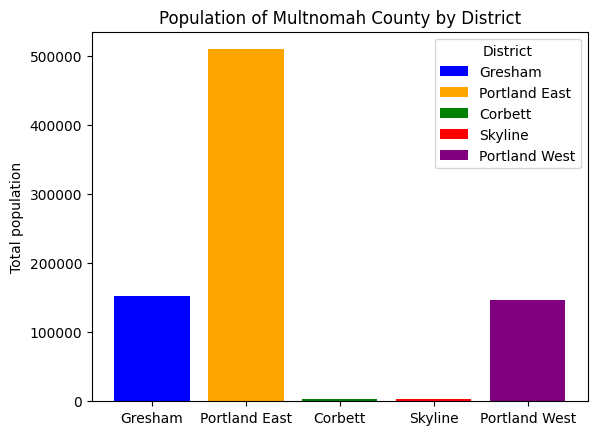

In [32]:
colors = ['blue', 'orange', 'green', 'red', 'purple']

fig, ax = plt.subplots()
bar_labels = ['Gresham','Portland East','Corbett','Skyline','Portland West']

ax.bar(total_pop_rows['NAME'], total_pop_rows['Total population'], color = colors, label = bar_labels)

ax.set_ylabel('Total population')
ax.set_title('Population of Multnomah County by District')
ax.legend(title='District')

plt.show()

In [34]:
voting_age_columns = ['NAME','Selected Age Categories (18 years and over)','Female population (18 years and over)','Male Selected Age Categories (18 years and over)','geometry']
voting_age = final_gdf[voting_age_columns].copy()
voting_age

,NAME,Selected Age Categories (18 years and over),Female population (18 years and over),Male Selected Age Categories (18 years and over),geometry
0,Gresham,"116,435","60,011","56,424","POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
1,Gresham,76.60%,77.70%,75.50%,"POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
2,Portland East,"417,991","214,102","203,889","POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
3,Portland East,82.00%,82.70%,81.30%,"POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
4,Corbett,"3,136","1,580","1,556","POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
5,Corbett,79.50%,79.70%,79.20%,"POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
6,Skyline,"2,362","1,148","1,214","POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
7,Skyline,85.20%,84.50%,86.00%,"POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
8,Portland West,"126,786","63,361","63,425","POLYGON ((-122.86749 45.60623, -122.86423 45.6..."
9,Portland West,86.20%,86.40%,85.90%,"POLYGON ((-122.86749 45.60623, -122.86423 45.6..."


In [39]:
age_breakdown_columns = ['NAME','Total population', 'Total population (15 to 19 years)','Total population (20 to 24 years)','Total population (25 to 29 years)','Total population (30 to 34 years)',
        'Total population (35 to 39 years)','Total population (40 to 44 years)','Total population (45 to 49 years)','Total population (50 to 54 years)','Total population (55 to 59 years)',
        'Total population (60 to 64 years)','Total population (65 to 69 years)','Total population (70 to 74 years)','Total population (75 to 79 years)','Total population (80 to 84 years)',
        'Total population (85 years and over)','geometry']
age_breakdown = final_gdf[age_breakdown_columns].copy()
age_breakdown



,NAME,Total population,Total population (15 to 19 years),Total population (20 to 24 years),Total population (25 to 29 years),Total population (30 to 34 years),Total population (35 to 39 years),Total population (40 to 44 years),Total population (45 to 49 years),Total population (50 to 54 years),Total population (55 to 59 years),Total population (60 to 64 years),Total population (65 to 69 years),Total population (70 to 74 years),Total population (75 to 79 years),Total population (80 to 84 years),Total population (85 years and over),geometry
0,Gresham,"151,977","9,932","10,342","11,002","11,260","10,618","9,746","9,016","8,969","9,373","9,128","8,045","6,070","3,904","2,438","2,586","POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
1,Gresham,100.00%,6.50%,6.80%,7.20%,7.40%,7.00%,6.40%,5.90%,5.90%,6.20%,6.00%,5.30%,4.00%,2.60%,1.60%,1.70%,"POLYGON ((-122.58601 45.60474, -122.58233 45.6..."
2,Portland East,"509,591","25,358","30,399","45,382","51,549","49,260","41,968","36,339","31,219","27,678","26,170","24,414","18,509","10,985","6,501","6,876","POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
3,Portland East,100.00%,5.00%,6.00%,8.90%,10.10%,9.70%,8.20%,7.10%,6.10%,5.40%,5.10%,4.80%,3.60%,2.20%,1.30%,1.30%,"POLYGON ((-122.79107 45.62645, -122.79057 45.6..."
4,Corbett,"3,947",266,170,145,179,248,272,273,256,283,317,343,258,171,74,47,"POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
5,Corbett,100.00%,6.70%,4.30%,3.70%,4.50%,6.30%,6.90%,6.90%,6.50%,7.20%,8.00%,8.70%,6.50%,4.30%,1.90%,1.20%,"POLYGON ((-122.39710 45.57260, -122.39180 45.5..."
6,Skyline,"2,771",104,88,105,144,128,188,179,164,276,267,317,230,144,52,43,"POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
7,Skyline,100.00%,3.80%,3.20%,3.80%,5.20%,4.60%,6.80%,6.50%,5.90%,10.00%,9.60%,11.40%,8.30%,5.20%,1.90%,1.60%,"POLYGON ((-122.92919 45.67101, -122.92896 45.6..."
8,Portland West,"147,142","6,594","11,182","15,658","14,371","11,792","10,182","9,623","9,033","8,562","8,598","8,673","7,115","4,335","2,445","2,246","POLYGON ((-122.86749 45.60623, -122.86423 45.6..."
9,Portland West,100.00%,4.50%,7.60%,10.60%,9.80%,8.00%,6.90%,6.50%,6.10%,5.80%,5.80%,5.90%,4.80%,2.90%,1.70%,1.50%,"POLYGON ((-122.86749 45.60623, -122.86423 45.6..."


# Mapping


In [40]:
m = folium.Map(location = [45.523064,-122.676483], zoom_start= 10)

In [45]:
popup = folium.GeoJsonPopup(
    fields=['NAME','Total population (15 to 19 years)','Total population (20 to 24 years)','Total population (25 to 29 years)','Total population (30 to 34 years)',
        'Total population (35 to 39 years)','Total population (40 to 44 years)','Total population (45 to 49 years)','Total population (50 to 54 years)','Total population (55 to 59 years)',
        'Total population (60 to 64 years)','Total population (65 to 69 years)','Total population (70 to 74 years)','Total population (75 to 79 years)','Total population (80 to 84 years)',
        'Total population (85 years and over)'],
    aliases=['District','15 to 19 years','20 to 24 years','25 to 29 years','30 to 34 years',
        '35 to 39 years','40 to 44 years','45 to 49 years','50 to 54 years','55 to 59 years',
        '60 to 64 years','65 to 69 years','70 to 74 years','75 to 79 years','80 to 84 years',
        '85 years and over'],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

In [46]:
tooltip = folium.GeoJsonTooltip(
    fields=['NAME','Total population (15 to 19 years)','Total population (20 to 24 years)','Total population (25 to 29 years)','Total population (30 to 34 years)',
        'Total population (35 to 39 years)','Total population (40 to 44 years)','Total population (45 to 49 years)','Total population (50 to 54 years)','Total population (55 to 59 years)',
        'Total population (60 to 64 years)','Total population (65 to 69 years)','Total population (70 to 74 years)','Total population (75 to 79 years)','Total population (80 to 84 years)',
        'Total population (85 years and over)'],
    aliases=['District','15 to 19 years','20 to 24 years','25 to 29 years','30 to 34 years',
        '35 to 39 years','40 to 44 years','45 to 49 years','50 to 54 years','55 to 59 years',
        '60 to 64 years','65 to 69 years','70 to 74 years','75 to 79 years','80 to 84 years',
        '85 years and over'],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 1px solid black;
        border-radius: 2px;
        box-shadow: 2px;
    """,
    max_width=800,
)

In [47]:
g = folium.GeoJson(age_breakdown,tooltip=tooltip,popup=popup).add_to(m)


In [48]:
m